# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = '/u200/Udacity/traffic-signs-data/train.p'
testing_file = '/u200/Udacity/traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
import pandas as pd
import numpy as np

y_train_df = pd.DataFrame(y_train)
y_train_df.columns=['id']
y_test_df = pd.DataFrame(y_test)
y_test_df.columns=['id']

# found data here https://github.com/domluna/traffic-signs/blob/master/signnames.csv
signnames_file = '/u200/Udacity/traffic-signs-data/signnames.csv'
signnames_df = pd.read_csv(signnames_file)
signnames_df.columns=['id','sign_name']

In [3]:
### Replace each question mark with the appropriate value.

# TODO: Number of training examples
n_train = X_train.data.shape[0]

# TODO: Number of testing examples.
n_test = X_test.data.shape[0]

# TODO: What's the shape of an traffic sign image?
image_shape = [X_train.data.shape[1], X_train.data.shape[2]]

# TODO: How many unique classes/labels there are in the dataset.

n_classes = len(pd.concat([y_train_df,y_test_df])['id'].unique())

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = [32, 32]
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

In [4]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline
import cv2

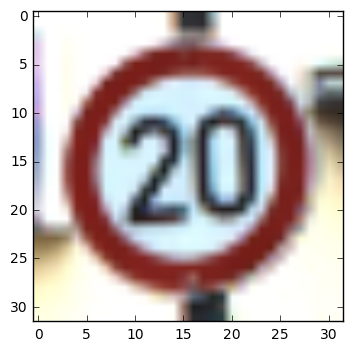

In [5]:
img=X_train[140]
plt.imshow(img)

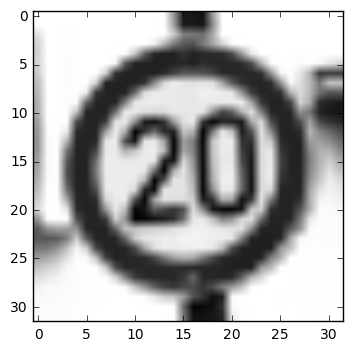

In [6]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) #grayscale conversion
plt.imshow(gray, cmap='gray')

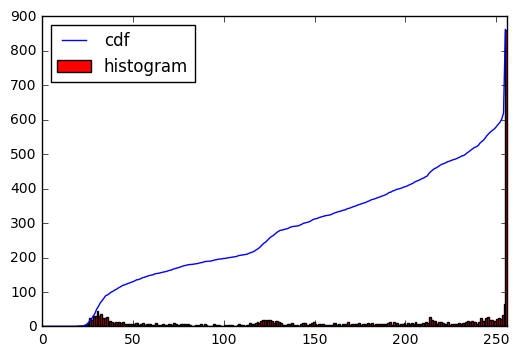

In [7]:
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

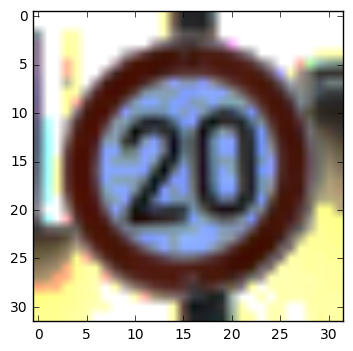

In [8]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
plt.imshow(cdf[img])

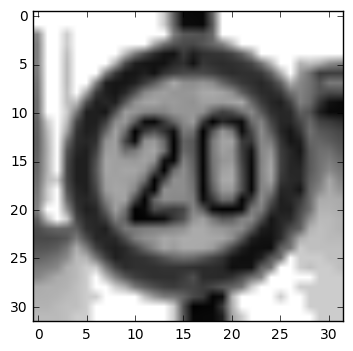

In [9]:
plt.imshow(cv2.equalizeHist(gray),cmap='gray')

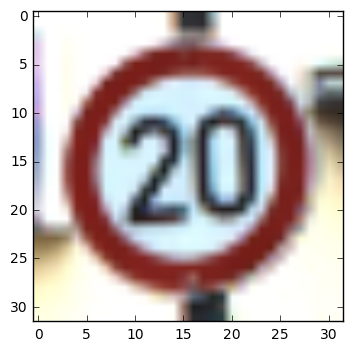

In [10]:
cdf_img=img
cv2.normalize(cdf_img, cdf_img, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
plt.imshow(cdf_img)

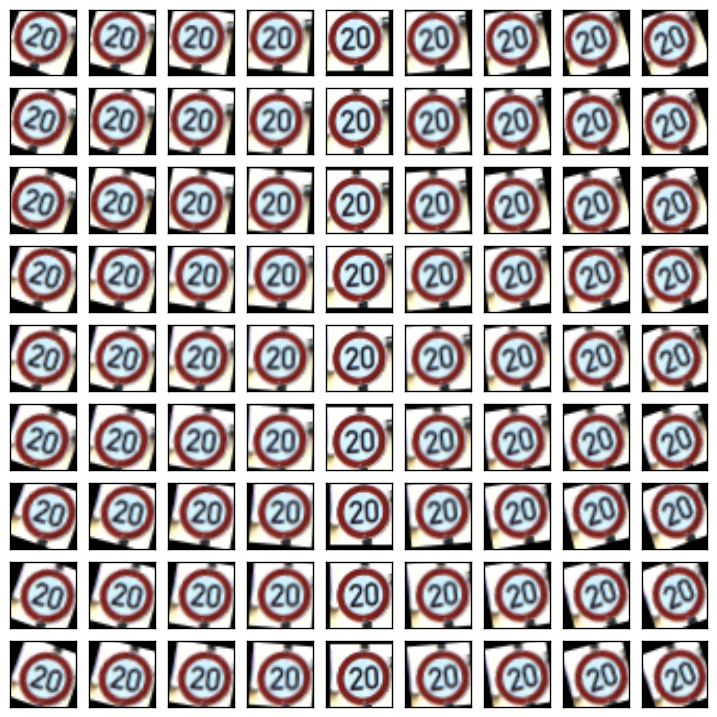

In [11]:
def jitter_image_test(img):
    cols,rows=32,32
    degrees=[-20,-15,-10,-5,0,5,10,15,20]
    Ms=[cv2.getRotationMatrix2D((cols/2,rows/2),d,1) for d in degrees]
    #print(Ms[0])
    positions=np.float32([[[1,0,r[0]],[0,1,r[1]]] for r in np.subtract(np.indices((3,3)).reshape(2,-1).T*2,[2,2])])
    pos_no=len(positions)
    img_no=len(degrees)
    fig = plt.figure(figsize=(pos_no, img_no), dpi=100)
    for p in range(len(positions)):
        for i in range(img_no):
            plt.subplot(len(positions), img_no, (p*img_no)+i+1)
#             plt.imshow(cv2.warpAffine(img,np.add(Ms[i],positions[p]),(cols,rows)),cmap='gray')
            jimg=cv2.warpAffine(img,positions[p],(cols,rows))
            jimg=cv2.warpAffine(jimg,Ms[i],(cols,rows))
            plt.imshow(jimg)
            plt.xticks([]), plt.yticks([])
    plt.show()
jitter_image_test(img)

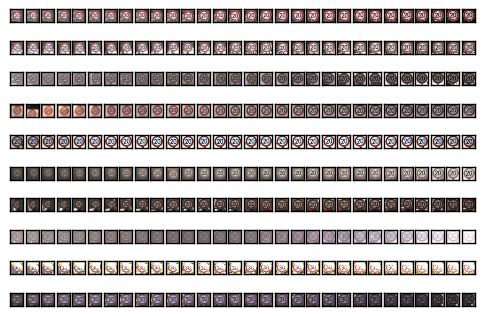

In [12]:
nosigns=10
imgpersign=30
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.imshow(X_train[i])
    plt.xticks([]), plt.yticks([])
plt.show()

In [13]:
join_df=y_train_df.join(signnames_df,on=['id'],rsuffix='_sign')
join_df.axes

[RangeIndex(start=0, stop=39209, step=1),
 Index(['id', 'id_sign', 'sign_name'], dtype='object')]

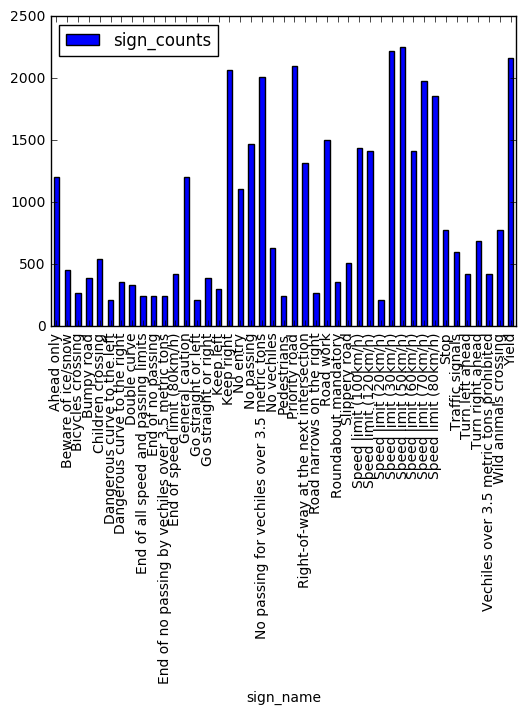

In [14]:
counts_df= pd.DataFrame(join_df.groupby('sign_name').size().rename('sign_counts'))
counts_df.plot.bar()

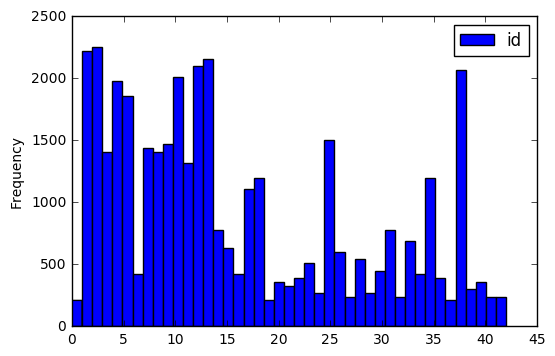

In [15]:
y_train_df.plot.hist(bins=n_classes)

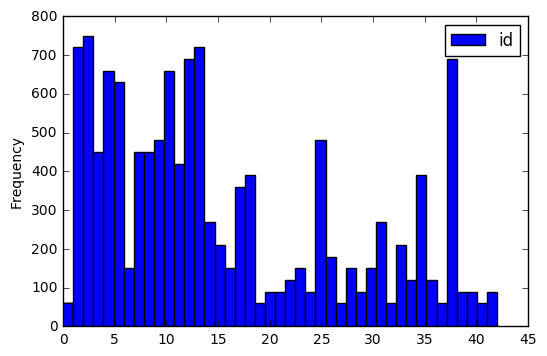

In [16]:
y_test_df.plot.hist(bins=n_classes)

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [17]:
### Preprocess the data here.
### Feel free to use as many code cells as needed.

def normalize(image):
    dest=np.empty(image.shape,dtype=np.float32)
    cv2.normalize(image, dest, alpha=0.1, beta=0.9, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    return dest

In [18]:
# not using this in this notebook 
def gray_normalized(images):
    # convert to gray and equalize
    gray_images = np.array([cv2.equalizeHist(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)) for img in images])
    
    gray_images = np.array([normalize(img) for img in gray_images])

    gray_images = gray_images.reshape(gray_images.shape[0], gray_images.shape[1] * gray_images.shape[2])

    return gray_images
    
    # Convert from [0, 255] -> [0.0, 1.0].
    #return np.multiply(gray_images.astype(np.float32), 1.0 / 255.0)

      
#X_train_gray = gray_normalized(X_train)
#X_test_gray = gray_normalized(X_test)
#print(X_train_gray[0])

In [19]:
# nosigns=10
# imgpersign=30
# fig = plt.figure(figsize=(30, 10), dpi=200)
# for i in range(nosigns*imgpersign):
#     plt.subplot(nosigns, imgpersign, i+1)
#     plt.imshow(X_train_gray[i].reshape(32,32),cmap='gray')
#     plt.xticks([]), plt.yticks([])
# plt.show()

In [20]:
def yuv_normalized(images):
    
    def equalize_and_normalise(image):    
        yuv=cv2.split(cv2.cvtColor(image, cv2.COLOR_RGB2YUV))
        yuv[0]=cv2.equalizeHist(yuv[0])

        norm=normalize(cv2.cvtColor(cv2.merge(yuv), cv2.COLOR_YUV2RGB))
        return norm
        
        #return np.multiply(image_eq.astype(np.float32), 1.0 / 255.0)
#         dest=np.empty(image_eq.shape,dtype=np.float32)
#         cv2.normalize(image_eq, dest, alpha=0, beta=-.5, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
#         return dest
    
    # convert to yuv
    converted_images = np.array([equalize_and_normalise(img) for img in images])

    return converted_images
    
    # Convert from [0, 255] -> [0.0, 1.0].
    #return np.multiply(images.astype(np.float32), 1.0 / 255.0)

X_train_yuv = yuv_normalized(X_train)
X_test_yuv = yuv_normalized(X_test)

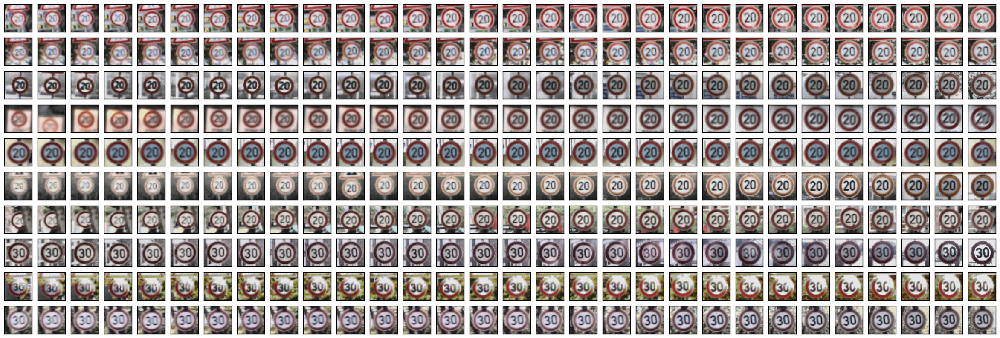

In [21]:
# images equalized and normalized
nosigns=10
imgpersign=30
fig = plt.figure(figsize=(30, 10), dpi=200)
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.imshow(X_train_yuv[i],)
    plt.xticks([]), plt.yticks([])
plt.show()

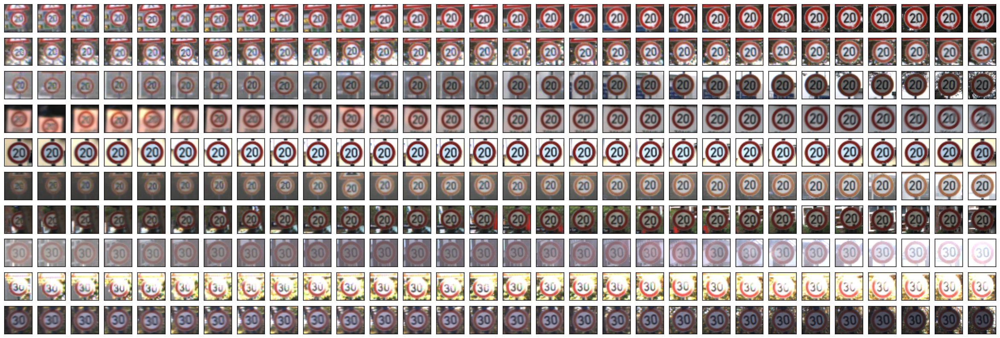

In [22]:
# images with no filtering
nosigns=10
imgpersign=30
fig = plt.figure(figsize=(30, 10), dpi=200)
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.imshow(X_train[i])
    plt.xticks([]), plt.yticks([])
plt.show()

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

Images were converted and split into YUV components. Y was equalized before merging back. This made the image brightness more consistent. The colourspace was converted back to RGB (YUV images didnt plot well) as it appeared to make no difference to accuracy when training.  

Normalization was applied and values converted to between 0 and 1 to standardize inputs.

id: 0 count: 210
id: 1 count: 2220
id: 2 count: 2250
id: 3 count: 1410
id: 4 count: 1980
id: 5 count: 1860
id: 6 count: 420
id: 7 count: 1440
id: 8 count: 1410
id: 9 count: 1470
id: 10 count: 2010
id: 11 count: 1320
id: 12 count: 2100
id: 13 count: 2160
id: 14 count: 780
id: 15 count: 630
id: 16 count: 420
id: 17 count: 1110
id: 18 count: 1200
id: 19 count: 210
id: 20 count: 360
id: 21 count: 330
id: 22 count: 390
id: 23 count: 510
id: 24 count: 270
id: 25 count: 1500
id: 26 count: 600
id: 27 count: 240
id: 28 count: 540
id: 29 count: 270
id: 30 count: 450
id: 31 count: 780
id: 32 count: 240
id: 33 count: 689
id: 34 count: 420
id: 35 count: 1200
id: 36 count: 390
id: 37 count: 210
id: 38 count: 2070
id: 39 count: 300
id: 40 count: 360
id: 41 count: 240
id: 42 count: 240
136259 136259


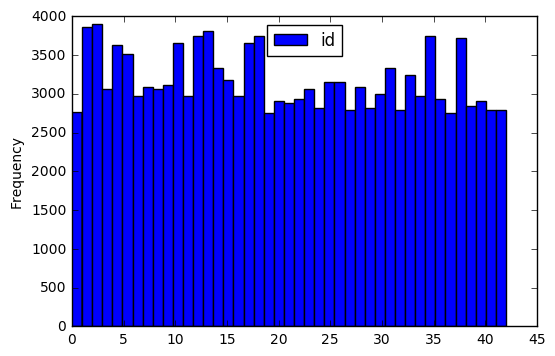

In [23]:
### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

import random

X_jittered = []
y_jittered =[]
cols,rows=32,32
     
def append(X,y):
    X_jittered.append(X)
    y_jittered.append(y)

def append_as_is(X,y,id):
    for index in y_train_df[y_train_df.id==id].index.tolist():
        append(X[index],y[index])
            
def jittered_data(X, y, id, count, img_total, rotations_M, positions_M):
    IMG_PER_BATCH = 30
    img_required_count = img_total - count
    
    existing_batches=count // IMG_PER_BATCH
    
    id_index=y_train_df[y_train_df.id==id].index.tolist()
    b_id = 0
    while img_required_count > 0:
        # find a new batch every IMG_PER_BATCH counf
        if img_required_count % IMG_PER_BATCH == 0:
            b_id=random.randrange(existing_batches-1)
#         b_img=random.randrange(IMG_PER_BATCH)
        b_img=img_required_count % IMG_PER_BATCH
        img_id = id_index[b_id*IMG_PER_BATCH+b_img]
        
        jimg=X[img_id]
        # pick a random matrix number
        r_M=rotations_M[random.randrange(len(rotations_M))]
        jimg=cv2.warpAffine(jimg,r_M,(cols,rows))
        
        # now perturb placement randomly
        p_M=positions_M[random.randrange(len(positions_M))]
        jimg=cv2.warpAffine(jimg,p_M,(cols,rows))
        
        append(jimg,y[img_id])
        img_required_count -= 1
        
def gen_additional_data(X,y):    
    
    # setup the image rotation matrices
    degrees=[-20,-15,-10,-5,5,10,15,20]
    rotations_M=[cv2.getRotationMatrix2D((cols/2,rows/2),d,1) for d in degrees]
    
    positions_M=np.float32([[[1,0,r[0]],[0,1,r[1]]] for r in np.subtract(np.indices((3,3)).reshape(2,-1).T*2,[2,2])])
   
    for id, count in y_train_df.groupby('id').size().rename('sign_counts').iteritems():
        print("id: %d count: %d" %(id, count))

        # append the data as is
        append_as_is(X,y,id)

        #  if we dont have enough images jitter the data to create more
        if count < 1250:
            img_total=count+(85*30)
            #img_total=count+(35*30)
            #print("creating up to %d jittered image data for id: %d" % (img_total, id))
            jittered_data(X, y, id, count, img_total, rotations_M, positions_M)
        else:
            img_total=count+(55*30)
            #img_total=count+(20*30)
            #print("creating up to %d jittered image data for id: %d" % (img_total,id))
            jittered_data(X, y, id, count, img_total, rotations_M, positions_M)

# gen_additional_data(X_train,y_train_1hot)
gen_additional_data(X_train_yuv,y_train)
assert len(X_jittered) == len(y_jittered)        
print (len(X_jittered),len(y_jittered))


y_jittered_df = pd.DataFrame(y_jittered)
y_jittered_df.columns=['id']
y_jittered_df.plot.hist(bins=n_classes)



In [24]:
signnames_df

,id,sign_name
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)
5,5,Speed limit (80km/h)
6,6,End of speed limit (80km/h)
7,7,Speed limit (100km/h)
8,8,Speed limit (120km/h)
9,9,No passing


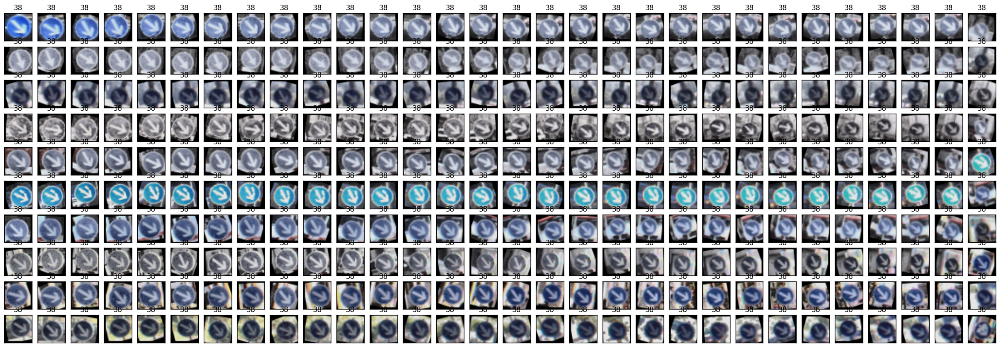

In [25]:
# display a random batch of 10 signs
#jittered_names_df=y_jittered_df.join(signnames_df,on=['id'],rsuffix='_sign')
nosigns=10
imgpersign=30
fig = plt.figure(figsize=(30, 10), dpi=200)
startindex = random.randrange(len(X_jittered)//imgpersign-nosigns)*imgpersign
for i in range(nosigns*imgpersign):
    plt.subplot(nosigns, imgpersign, i+1)
    plt.title(y_jittered_df.iloc[startindex + i].id)
    plt.imshow(X_jittered[startindex + i])
    plt.xticks([]), plt.yticks([])
plt.show()

In [26]:
def batch(inputs, targets, batchsize):
    assert len(inputs) == len(targets)
    for start_idx in range(0, len(inputs), batchsize):
        batch_slice = slice(start_idx, start_idx + batchsize)
        yield inputs[batch_slice], targets[batch_slice]

In [27]:
import random
from sklearn.model_selection import train_test_split
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_jittered, y_jittered, test_size=0.10, random_state=74723)
# validation_size=5000
# X_val_split = X_train_gray[:validation_size]
# y_val_split = y_train_1hot[:validation_size]
# X_train_split = X_train_gray[validation_size:]
# y_train_split = y_train_1hot[validation_size:]

# X_train_temp = []
# X_val_temp = []
# y_train_temp = []
# y_val_temp = []

# from sklearn.model_selection import LeaveOneOut
# loo = LeaveOneOut()

# from sklearn.model_selection import KFold
# kf = KFold(n_splits=5)

# imgpersign = 30
# batch_count = 0
# #for X,y in batch(X_train_yuv, y_train_1hot, imgpersign):
# for X,y in batch(X_jittered, y_jittered, imgpersign):

# #for X,y in batch(X_train, y_train_1hot, imgpersign):
#     batch_count += 1
    
#     split=[(t_index,val_index) for t_index, val_index in loo.split(X)]
#     t_index, val_index=split[random.randrange(imgpersign)]
# #     for t_index, val_index in loo.split(X):
# #     for t_index, val_index in kf.split(X):
#     for i in t_index:
#         X_train_temp.append(X[i])
#         y_train_temp.append(y[i])
#     for i in val_index:
#         X_val_temp.append(X[i])
#         y_val_temp.append(y[i])

# print ("Batch count =", batch_count)
# X_train_split = np.array(X_train_temp)
# X_val_split = np.array(X_val_temp)
# y_train_split = np.array(y_train_temp)
# y_val_split = np.array(y_val_temp)    

assert len(X_train_split) == len(y_train_split)
assert len(X_val_split) == len(y_val_split)

print("Number of training examples =", len(X_train_split))
print("Number of validation examples =", len(X_val_split))
print("Number of testing examples =", len(X_test))

# print(X_train_split.shape)
# print(y_train_split.shape)
# print(X_val_split.shape)
# print(y_val_split.shape)

Number of training examples = 122633
Number of validation examples = 13626
Number of testing examples = 12630


### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

If < 1250 (had small sample size) images in a sign category, an additional 85 sets of 30 randomily jittered images were produced otherwise it was 55 sets. Jittered images were generated by rotating randomly between [-20,-15,-10,-5,5,10,15,20] degrees with a random perturb in the x and y direction of [0,2] pixels applied. 

The jittered data was then split randomily with 90% to train and 10 % to test. This resulted in a training set of 122633 with 13626 for validation test.  

The original training set had 39209 examples with some sign categories having few images. The new jittered dataset had a more equal number of training images per category. 

I experimented with leave one out (and randomily selecting one row so as not to expand my dataset 30 times) and kfolds but my training models achieved poor accuracy and took considerably longer to run. In hindsight I should of randomised the datasets after the split. Instead I achieved further randomisness by increasing the size of the jittered datasets for each category.

y values are one hot encoded as tensorflow variables later.

Test data was not augmented with jittered data.

In [28]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

In [29]:
import tensorflow as tf
from tensorflow.contrib.layers import flatten
import os
print(tf.__version__)

0.12.0


In [30]:
# using https://www.tensorflow.org/how_tos/summaries_and_tensorboard/#launching_tensorboard
def variable_summaries(var):
    """Attach a lot of summaries to a Tensor (for TensorBoard visualization)."""
    with tf.name_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram('histogram', var)

def nn_layer(input_tensor, W, b, layer_name, act=tf.nn.relu):
    """Reusable code for making a simple neural net layer.

    It does a matrix multiply, bias add, and then uses relu to nonlinearize.
    It also sets up name scoping so that the resultant graph is easy to read,
    and adds a number of summary ops.
    """
    # Adding a name scope ensures logical grouping of the layers in the graph.
    with tf.name_scope(layer_name):
        # This Variable will hold the state of the weights for the layer
        with tf.name_scope('weights'):
            variable_summaries(W)
        with tf.name_scope('biases'):
            variable_summaries(b)
        with tf.name_scope('Wx_plus_b'):
            preactivate = tf.matmul(input_tensor, W) + b
            tf.summary.histogram('pre_activations', preactivate)
        activations = act(preactivate, name='activation')
        tf.summary.histogram('activations', activations)
        return activations

In [31]:
def conv2d(x, W, b, layer_name='conv1', strides=1):
    # Conv2D wrapper, with bias and relu activation
    with tf.name_scope(layer_name):
        tf.summary.scalar('strides', strides)
        with tf.name_scope('weights'):
            variable_summaries(W)
        with tf.name_scope('biases'):
            variable_summaries(b)
        with tf.name_scope('conv2d_plus_b'):
            conv = tf.nn.conv2d(x, W, strides=[1, strides, strides, 1], padding='VALID') + b
            tf.summary.histogram('pre_activations',conv)
        x = tf.nn.relu(conv)
        tf.summary.histogram('activations', x)
        return x
    
def maxpool2d(x, layer_name='maxpool1', k=2):
    with tf.name_scope(layer_name):
        tf.summary.scalar('k', k)
        with tf.name_scope('max_pool'):
            x = tf.nn.max_pool(
                x,
                ksize=[1, k, k, 1],
                strides=[1, k, k, 1],
                padding='VALID')
            tf.summary.histogram('post_max_pool', x)
            return x

def conv_net(x, weights, biases, keep_prob):

    print("shape ", x)
    #x = tf.reshape(x, (-1, 32, 32, 3))
    with tf.name_scope('input'):
        #x = tf.pad(x, [[0, 0], [2, 2], [2, 2], [0, 0]], mode="CONSTANT")
        tf.summary.image('input', x, 100)
    
    #print("new shape ", x)
        
    # Convolution Layer
    conv1 = conv2d(x, weights['wc1'], biases['bc1'], 'conv1', strides=1)
    print("conv1 shape ", conv1)
    
    # Max Pooling (down-sampling)
    conv1 = maxpool2d(conv1, 'maxpool1', k=2)
    # conv1 = tf.nn.dropout(conv1, dropout)
    print("conv1 after maxpool shape ", conv1)
    
    # Convolution Layer
    conv2 = conv2d(conv1, weights['wc2'], biases['bc2'], 'conv2', strides=1)
    print("conv2 shape ", conv2)
        
    # Max Pooling (down-sampling)
    conv2 = maxpool2d(conv2, 'maxpool2', k=2)
    # conv2 = tf.nn.dropout(conv2, dropout)
    print("conv2 after maxpool shape ", conv2)
    
    
    # Reshape conv1 output to fit fully connected layer input
    with tf.name_scope('flatten'):
        flat1 = flatten(conv2) 
    print("flat1 shape", flat1)
    
    # Fully connected layer
    fc1 = nn_layer(flat1, weights['wd1'], biases['bd1'],'fc1')
    print("fc1 shape", fc1)
    
    # Fully connected layer
    fc2 = nn_layer(fc1, weights['wd2'], biases['bd2'],'fc2')
    print("fc2 shape", fc2)
    
    # Apply Dropout
    with tf.name_scope('dropout'):    
        tf.summary.scalar('dropout_keep_probability', keep_prob)
        dropped = tf.nn.dropout(fc2, keep_prob)

    # Output, class prediction
    #out = tf.nn.bias_add(tf.matmul(dropped, weights['out']), biases['out']) 
    out = nn_layer(dropped, weights['out'], biases['out'], 'out', act=tf.identity)
    
    print("out shape ", out)
    return out

In [32]:
# Hyperparameters
mu = 0
sigma = 0.1

def weight_variable(shape):
    w = tf.truncated_normal(shape, mean = mu, stddev = sigma)
    return tf.Variable(w, name='weights')

def bias_variable(shape):
    b = tf.zeros(shape=shape)
    return tf.Variable(b, name='biases')

# Store layers weight & bias
weights = {
    'wc1': weight_variable([5, 5, 3, 12]),
    'wc2': weight_variable([5, 5, 12, 32]),
    'wd1': weight_variable([5*5*32, 240]),
    'wd2': weight_variable([240, 168]),
    'out': weight_variable([168, n_classes])
}

biases = {
    'bc1': bias_variable([12]),
    'bc2': bias_variable([32]),
    'bd1': bias_variable([240]),
    'bd2': bias_variable([168]),
    'out': bias_variable([n_classes])
}

with tf.name_scope('input'):
    #  consists of 32x32x3, color images
    x = tf.placeholder(tf.float32, (None,32,32,3), name='x-input')
    # Classify over 43 unique label classes
    y = tf.placeholder(tf.float32, (None, n_classes), name='y-input')

keep_prob = tf.placeholder(tf.float32, name='keep-prob') #dropout (keep probability)

# Construct the model
logits = conv_net(x, weights, biases, keep_prob)

# with tf.name_scope('softmax'):
#     prediction=tf.nn.softmax(logits)
    
with tf.name_scope('cross_entropy'):
    # Define loss and optimizer
    cross_entropy = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits, y))
    #cross_entropy = tf.reduce_mean(-tf.reduce_sum(y * tf.log(prediction + 1e-6), reduction_indices=1))
    with tf.name_scope('total'):
        cross_entropy = tf.reduce_mean(cross_entropy)
tf.summary.scalar('cross_entropy', cross_entropy)

#learning_rate = 0.0001
learning_rate = 0.001

with tf.name_scope('train'):
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cross_entropy)
    
#optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate,epsilon=0.9).minimize(cost)
##optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)
#optimizer = tf.train.AdamOptimizer().minimize(cost)

with tf.name_scope('accuracy'):
    with tf.name_scope('correct_prediction'):
        #correct_prediction = tf.equal(tf.argmax(out, 1), tf.argmax(y, 1))
        correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(y, 1))
    with tf.name_scope('accuracy'):    
        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
tf.summary.scalar('accuracy', accuracy)

shape  Tensor("input/x-input:0", shape=(?, 32, 32, 3), dtype=float32)
conv1 shape  Tensor("conv1/Relu:0", shape=(?, 28, 28, 12), dtype=float32)
conv1 after maxpool shape  Tensor("maxpool1/max_pool/MaxPool:0", shape=(?, 14, 14, 12), dtype=float32)
conv2 shape  Tensor("conv2/Relu:0", shape=(?, 10, 10, 32), dtype=float32)
conv2 after maxpool shape  Tensor("maxpool2/max_pool/MaxPool:0", shape=(?, 5, 5, 32), dtype=float32)
flat1 shape Tensor("flatten/Flatten/Reshape:0", shape=(?, 800), dtype=float32)
fc1 shape Tensor("fc1/activation:0", shape=(?, 240), dtype=float32)
fc2 shape Tensor("fc2/activation:0", shape=(?, 168), dtype=float32)
out shape  Tensor("out/activation:0", shape=(?, 43), dtype=float32)


<tf.Tensor 'accuracy_1:0' shape=() dtype=string>

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

This architecture is based on the LeNet-5 neural network architecture.

## Input
The input is a 32x32xC with C = 3 color channels.

## Architecture
**Layer 1: Convolution** with strides=1 and output shape 28x28x12. **relu activation** and **pooling** output 14x14x12.

**Layer 2: Convolution** with strides=1 and output shape 10x10x32. **relu activation** and **pooling** output 5x5x32 and **flatten** shape 800 outputs

**Layer 3: Fully Connected** with 240 outputs and **relu activation**

**Layer 4: Fully Connected** with 168 outputs, **relu activation** and **dropout**

**Layer 5: Fully Connected** with 43 (n_classes) outputs

## Ouput
Returns the results of Layer 5

## Visualization
![Model Graph](https://raw.githubusercontent.com/hortovanyi/Udacity/master/P2-TensorBoard-graph.png)

In [33]:
def eval_data(X_data, y_data, writer, step):
    """
    Given X_data, y_data as input returns the loss and accuracy.
    """

    num_examples = len(X_data)
   # print ("BATCH_SIZE: %d, num_examples: %d" % (BATCH_SIZE,num_examples))

    total_acc, total_loss = 0., 0.
    batch_size=[]
    for batch_x, batch_y in batch(X_data, y_data, BATCH_SIZE):
        size=len(batch_x)
        batch_size.append(size)
        summary, acc = sess.run([merged, accuracy], feed_dict={x: batch_x, y: batch_y, keep_prob: 1.})
        writer.add_summary(summary, step)

        total_acc += (acc * size)
    
    #print("batch_sizes: ", batch_size)
    return total_acc/num_examples

EPOCHS = 30
BATCH_SIZE = 1000
#dropout_keep_prob = 0.75 # Dropout, probability to keep units
dropout_keep_prob = 0.25 # Dropout, probability to keep units

saver = tf.train.Saver()

y_train_1hot = tf.one_hot(y_train_split, n_classes).eval(session=tf.Session())
y_val_1hot = tf.one_hot(y_val_split, n_classes).eval(session=tf.Session())
y_test_1hot = tf.one_hot(y_test, n_classes).eval(session=tf.Session())


log_dir='/tmp/tf/tsr/logs' 
if tf.gfile.Exists(log_dir):
    tf.gfile.DeleteRecursively(log_dir)
tf.gfile.MakeDirs(log_dir)

with tf.Session() as sess:
    # Merge all the summaries and write them out to /tmp/tf/tsr/logs
    merged = tf.summary.merge_all()
    train_writer = tf.summary.FileWriter(log_dir + '/train', sess.graph)
    val_writer = tf.summary.FileWriter(log_dir + '/validation')
    test_writer = tf.summary.FileWriter(log_dir + '/test')

    sess.run(tf.global_variables_initializer())

    val_accuracies=[]
    step = 0
    # Train model
    for i in range(EPOCHS):
        
        # change the dropout_keep_prob
#         if i > 5:
#             dropout_keep_prob = 0.75
            
        for batch_x, batch_y in batch(X_train_split, y_train_1hot, BATCH_SIZE):
            step += 1
            
            if step % 1000 == 0: # record a summery with trace               
                run_options = tf.RunOptions(trace_level=tf.RunOptions.FULL_TRACE)
                run_metadata = tf.RunMetadata()
                summary, _ = sess.run([merged,  optimizer],
                                      feed_dict={x: batch_x, y: batch_y, keep_prob: dropout_keep_prob},
                                      options=run_options,
                                      run_metadata=run_metadata)
                train_writer.add_run_metadata(run_metadata, 'epoch%03d-step%04d' % (i,step))
                train_writer.add_summary(summary, step)
                print('Adding run metadata for ', step)
            elif step % 100 == 1: # record a summary
                summary, _ = sess.run([merged, optimizer], feed_dict={x: batch_x, y: batch_y, keep_prob: dropout_keep_prob})
                train_writer.add_summary(summary, step)
            else:
                _ = sess.run(optimizer, feed_dict={x: batch_x, y: batch_y, keep_prob: dropout_keep_prob})  
        
        val_acc = eval_data(X_val_split, y_val_1hot, val_writer, step)
        val_accuracies.append(val_acc)
        print("EPOCH {:3d} Validation accuracy = {:.3f}".format(i+1, val_acc))
        
        # save a model checkpoint for tensorboard
        saver.save(sess, log_dir+'/model.ckpt', step)
        
        if i+1 > 10 and val_acc < 0.10:
            print("Oh crapppy ... exit")
            break

    # Evaluate on the test data
    test_acc = eval_data(X_test_yuv, y_test_1hot, test_writer, step)
    print("Test accuracy = {:.3f}".format(test_acc))

    saver.save(sess, os.getcwd() + "/cnn-run")

train_writer.close()
val_writer.close()
test_writer.close()

EPOCH   1 Validation accuracy = 0.461
EPOCH   2 Validation accuracy = 0.660
EPOCH   3 Validation accuracy = 0.754
EPOCH   4 Validation accuracy = 0.819
EPOCH   5 Validation accuracy = 0.855
EPOCH   6 Validation accuracy = 0.885
EPOCH   7 Validation accuracy = 0.897
EPOCH   8 Validation accuracy = 0.917
Adding run metadata for  1000
EPOCH   9 Validation accuracy = 0.929
EPOCH  10 Validation accuracy = 0.936
EPOCH  11 Validation accuracy = 0.945
EPOCH  12 Validation accuracy = 0.944
EPOCH  13 Validation accuracy = 0.955
EPOCH  14 Validation accuracy = 0.961
EPOCH  15 Validation accuracy = 0.964
EPOCH  16 Validation accuracy = 0.967
Adding run metadata for  2000
EPOCH  17 Validation accuracy = 0.970
EPOCH  18 Validation accuracy = 0.972
EPOCH  19 Validation accuracy = 0.973
EPOCH  20 Validation accuracy = 0.976
EPOCH  21 Validation accuracy = 0.974
EPOCH  22 Validation accuracy = 0.978
EPOCH  23 Validation accuracy = 0.978
EPOCH  24 Validation accuracy = 0.979
Adding run metadata for  300

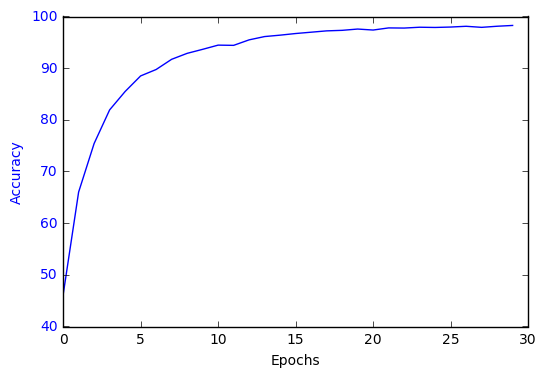

In [34]:
# plot the validation losses and accuracies for each epoch
fig, ax1 = plt.subplots()
e = np.arange(0, EPOCHS, 1)
#ax1.plot(e, val_losses, 'r-')
ax1.set_xlabel('Epochs')
# Make the y-axis label and tick labels match the line color.
#ax1.set_ylabel('losses', color='r')
#for tl in ax1.get_yticklabels():
#    tl.set_color('r')
    
#ax2 = ax1.twinx()
ax1.plot(e, np.multiply(val_accuracies,100),'b-')
ax1.set_ylabel('Accuracy', color='b')
for tl in ax1.get_yticklabels():
    tl.set_color('b')
plt.show()

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

The adam optimizer was used with a learning rate of 0.001. Batchsize was 1000 with 30 epochs and dropout rate of .25. Weights were initialised with truncated_normal and mu = 0, sigma = 0.1. 

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

Started with the LeNet model and altered. Eventually ended up with a LeNet 5 architecture, after adding summaries for tensorboard slowed down processing. LeNet 5 was faster and achieved high accuracy in 30 epochs. Found numerous things as I was researching via google. So there was a lot of trial and error. Some things are still left in the code commented out, some not. I'd like to try an inception style model with multiple convolution layers and each layer flattened before the fully connected layer. More learning is required before attempting (this was my first project of this type). The images did not look that detailed, were low resolution and I thought complicating the model further may not achieve a huge increase in test accuracy without going down the inception path. I also suspect but have not tried yet l2 normalisation on the weights with this model which may improve current overfitting (my test accuracy < train accuracy). Also some extra transformation in the jittered data may help reduce the overfitting. 

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [35]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

In [36]:
X_predict=[]
y_predict=[]
for i in range(20):
    r = random.randrange(len(X_test_yuv))
    X_predict.append(X_test_yuv[r])
    y_predict.append(y_test[r])

predict_count=len(X_predict)
y_predict_df = pd.DataFrame(y_predict)
y_predict_df.columns=['id']

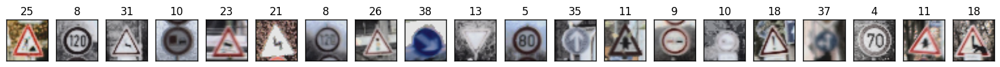

In [37]:
fig = plt.figure(figsize=(20, predict_count), dpi=200)

for i in range(predict_count):
    plt.subplot(1, predict_count, i+1)
    plt.title(y_predict_df.iloc[i].id)
    plt.imshow(X_predict[i])
    plt.xticks([]), plt.yticks([])
plt.show()

In [38]:
print("Number of predictions: %d" % (len(X_predict)))

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, os.getcwd() + "/cnn-run")
    print("Model restored.")
   
    ps=sess.run(tf.argmax(logits,1),feed_dict={x:X_predict, keep_prob: 1.0})
    print ([(p,signnames_df.iloc[p].sign_name) for p in ps])

Number of predictions: 20
Model restored.
[(25, 'Road work'), (8, 'Speed limit (120km/h)'), (31, 'Wild animals crossing'), (10, 'No passing for vechiles over 3.5 metric tons'), (23, 'Slippery road'), (11, 'Right-of-way at the next intersection'), (8, 'Speed limit (120km/h)'), (26, 'Traffic signals'), (38, 'Keep right'), (13, 'Yield'), (5, 'Speed limit (80km/h)'), (35, 'Ahead only'), (11, 'Right-of-way at the next intersection'), (9, 'No passing'), (10, 'No passing for vechiles over 3.5 metric tons'), (18, 'General caution'), (37, 'Go straight or left'), (4, 'Speed limit (70km/h)'), (11, 'Right-of-way at the next intersection'), (18, 'General caution')]


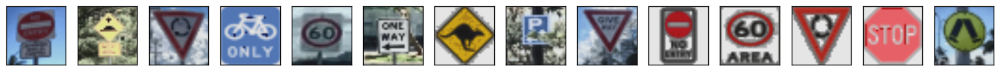

Number of predictions: 14
Model restored.
[(17, 'No entry'), (23, 'Slippery road'), (13, 'Yield'), (40, 'Roundabout mandatory'), (3, 'Speed limit (60km/h)'), (20, 'Dangerous curve to the right'), (7, 'Speed limit (100km/h)'), (40, 'Roundabout mandatory'), (13, 'Yield'), (12, 'Priority road'), (28, 'Children crossing'), (13, 'Yield'), (0, 'Speed limit (20km/h)'), (12, 'Priority road')]


In [39]:
from os import scandir
from os.path import isfile, join
road_signs_path='/u200/Udacity/signs/'
def image_file(file):
    if not file.name.startswith('.') and file.is_file() and (file.name.endswith('.jpg') or file.name.endswith('.png')):
         return True
    else: 
         return False

def load_image(path):
    img = cv2.cvtColor(cv2.imread(path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    return cv2.resize(img,(32,32), interpolation = cv2.INTER_AREA)
    
test_images=[load_image(f.path) for f in scandir(road_signs_path) if image_file(f)]
test_images=yuv_normalized(test_images)
test_image_count=len(test_images)

fig = plt.figure(figsize=(20, test_image_count), dpi=200)
for i in range(test_image_count):
    plt.subplot(1, test_image_count, i+1)
    plt.imshow(test_images[i])
    plt.xticks([]), plt.yticks([])
plt.show()

print("Number of predictions: %d" % (len(test_images)))

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, os.getcwd() + "/cnn-run")
    print("Model restored.")
   
    ps=sess.run(tf.argmax(logits,1),feed_dict={x:test_images, keep_prob: 1.0})
    print ([(p,signnames_df.iloc[p].sign_name) for p in ps])

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

Five visualisation of choosen Australian sign images are in the following cells. The first 60 KM/H image I choose as its a universal traffic sign which the classifier should recognise. The Kangaroo sign as it would not be recognisable by the classifier. The giveway and roundabout signs are based on a yield sign and thought the classifier may not be able to distingish the detail within when compared to the german signs. The last sign is a pedestrian crossing sign. I was hoping that the classifier would recognise the legs. 

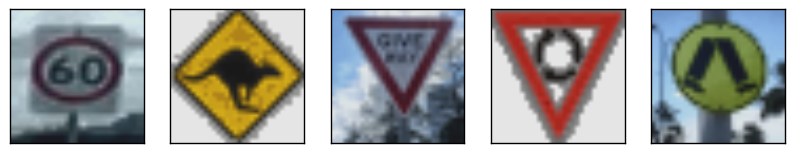

Number of predictions: 5
Model restored.


In [40]:
### Run the predictions here.
### Feel free to use as many code cells as needed.
saver = tf.train.Saver()
test_images=[load_image(f.path) for f in scandir(road_signs_path+'/candidates') if image_file(f)]
test_images=yuv_normalized(test_images)
test_image_count=len(test_images)

fig = plt.figure(figsize=(10, test_image_count), dpi=200)
for i in range(test_image_count):
    plt.subplot(1, test_image_count, i+1)
    plt.imshow(test_images[i])
    plt.xticks([]), plt.yticks([])
plt.show()

print("Number of predictions: %d" % (len(test_images)))

with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, os.getcwd() + "/cnn-run")
    print("Model restored.")
   
    ps=sess.run(tf.argmax(logits,1),feed_dict={x:test_images, keep_prob: 1.0})

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


In [41]:
print ([(p,signnames_df.iloc[p].sign_name) for p in ps])

matches=[True, False, False, False, False]
print("Accuracy %d%%" % (matches.count(True)/len(matches) *100))

[(3, 'Speed limit (60km/h)'), (7, 'Speed limit (100km/h)'), (13, 'Yield'), (13, 'Yield'), (12, 'Priority road')]
Accuracy 20%


**Answer:**

The test images achieved an accurary of ~93% which is substantially higher then the accuracy of 20% on the captured images. This model as trained has a low accuracy rate for the capture images.


#### I choose some road signs that you see everyday here as well as one that is unique to Australia.

#### Australian road signs are significantly different to german ones that the trained model had poor accuracry.
- Kangaroo sign picked up as a 100 KM/H speed sign - could be dangeours at dusk
- Giveway and roundabout both were recognised as yield
- Pedestrian crossing recognised as priority road

In [42]:
### Visualize the softmax probabilities here.
### Feel free to use as many code cells as needed.

In [43]:
def softmax_image_explore(timage):
    with tf.Session() as sess:
        # Restore variables from disk.
        saver.restore(sess, os.getcwd() + "/cnn-run")
        print("Model restored.")
    
        image_logits=sess.run(logits,feed_dict={x:[timage], keep_prob: 1.0})
        print(image_logits)
            
        softmax=sess.run(tf.nn.softmax(image_logits))
        print(softmax)

        # experimented with softmax calculations 
        # per https://carnd-forums.udacity.com/questions/12619143/one-reason-for-low-accuracy-ill-conditioned-value-for-log-calculation
        # eventually realised I'd not normalised my captured test images 
        # - hence it was giving me large logit values
        image_logits -= np.max(image_logits)
        print(image_logits)

        predictions=sess.run(tf.nn.softmax(image_logits))
        print(predictions)

        probs = np.exp(image_logits) / np.sum(np.exp(image_logits))
        print(probs)

In [44]:
softmax_image_explore(X_test_yuv[1000])

Model restored.
[[ -4.61562042e+01  -5.08324051e+01  -7.92751083e+01  -7.06694870e+01
   -6.37671890e+01  -6.91638336e+01  -6.04528809e+01  -8.28787994e+01
   -7.22785110e+01  -2.89209328e+01  -1.91154289e+01  -6.40589371e+01
   -3.18741465e+00  -9.01575089e+00   3.73222160e+01  -2.35156002e+01
   -2.73022232e+01   6.18419113e+01  -2.42793274e+01  -3.55732841e+01
   -3.95618629e+01  -7.39626083e+01   3.79312038e-03  -4.04272614e+01
   -8.95236893e+01  -1.11791153e+01  -2.24213638e+01  -1.06182167e+02
   -6.33800507e+01  -1.15530500e+01  -6.46313400e+01  -4.10252495e+01
   -3.57342682e+01  -4.75003510e+01  -2.72125149e+01  -5.05686722e+01
   -4.34857788e+01  -5.44584541e+01  -3.21197243e+01  -4.78233376e+01
   -4.90383759e+01  -5.48683701e+01  -4.35477943e+01]]
[[  0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
    0.00000000e+00   0.00000000e+00   0.00000000e+00   0.00000000e+00
    0.00000000e+00   0.00000000e+00   6.92907930e-36   0.00000000e+00
    5.72956876e-29 

In [45]:
softmax_image_explore(test_images[0])

Model restored.
[[ -8.17313004  -4.55781031   2.2321136   12.77190399 -10.19906998
    7.35318518 -13.32108879   3.98696733   4.62323999   1.542068
   -5.19146776 -26.43907356 -13.97586441  -2.80233097  -9.11998749
   -2.65735579 -14.67304325 -20.49495506 -24.25466919 -24.39175987
  -11.78066444 -25.31893158 -20.13846588 -15.30222511 -18.04647255
  -14.19710159 -21.36965179 -26.05438042  -2.42125583   0.59451002
  -10.34216499 -13.18104649  -9.17700005 -10.38549423 -13.04852962
   -5.15666437 -13.0664978  -21.65519905  -7.27651739 -24.65203667
  -16.70072746 -21.1189003  -20.07263565]]
[[  7.97178490e-10   2.96257365e-08   2.63327092e-05   9.95103478e-01
    1.05123792e-10   4.41111671e-03   4.63260723e-12   1.52271503e-04
    2.87705538e-04   1.32072573e-05   1.57208202e-08   9.30588942e-18
    2.40691104e-12   1.71420965e-07   3.09271969e-10   1.98164400e-07
    1.19861445e-12   3.55021027e-15   8.26859666e-17   7.20930322e-17
    2.16183859e-11   2.85251878e-17   5.07079704e-15   6.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**

In [46]:
from pylab import *
from matplotlib import gridspec
    
def topk_plot(test_images):
    with tf.Session() as sess:
        # Restore variables from disk.
        saver.restore(sess, os.getcwd() + "/cnn-run")
        print("Model restored.")

        #image_logits=sess.run(logits,feed_dict={x:test_images, keep_prob: 1.0})
        #image_logits -= np.max(image_logits)
        
        #softmax=tf.nn.softmax(logits/tf.reduce_sum(logits,1))
        softmax=tf.nn.softmax(logits)

        #probabilities=logits/tf.reduce_sum(logits,1)
        #probs=sess.run(tf.nn.softmax(image_logits))
        probs=sess.run(softmax,feed_dict={x:test_images, keep_prob: 1.0})
        
        #print("Softmax\n",probs)
        (values,indices)=sess.run(tf.nn.top_k(probs, k = 5))
        print("top_k values, indices")
        print(values,indices)

    indices_names=np.array([signnames_df.iloc[i].sign_name for i in indices.reshape(25)])
    image_values=np.array([p for p in zip(indices_names,values.reshape(25))])

    image_values=image_values.reshape(5,5,2)

    pos = arange(5) + .5    # the bar centers on the y axis

    fig = plt.figure(figsize=(10,6))
    gs = gridspec.GridSpec(len(test_images),2,width_ratios=[1,5])

    for i in range(len(image_values)):
        values=[float(v[1]) for v in  image_values[i]]
        labels=[v[0] for v in image_values[i]]

        plt.subplot(gs[i*2])
        plt.imshow(test_images[i])
        plt.xticks([]), plt.yticks([])
        plt.subplot(gs[i*2+1])
        plt.tight_layout()
        barh(-pos,values, align='center')
        yticks(-pos, labels)
        xlabel('softmax probabilities')

    show()

Model restored.
top_k values, indices
[[  9.99992132e-01   7.90465674e-06   2.52849097e-09   1.28761810e-11
    6.88690262e-17]
 [  1.00000000e+00   1.24432920e-09   1.39603335e-12   1.36804240e-12
    2.92626607e-14]
 [  6.59170985e-01   1.84875846e-01   1.09724134e-01   4.28372510e-02
    2.73583666e-03]
 [  1.00000000e+00   1.02223202e-10   6.06640649e-12   1.48613354e-14
    1.11699065e-14]
 [  1.00000000e+00   6.61636027e-15   7.39137334e-21   3.40986729e-22
    4.25128728e-26]] [[ 1  0  4  2 40]
 [10  5 42  9 23]
 [ 8  5  7  3  2]
 [11 21 30 42 12]
 [33 35 37 39 40]]


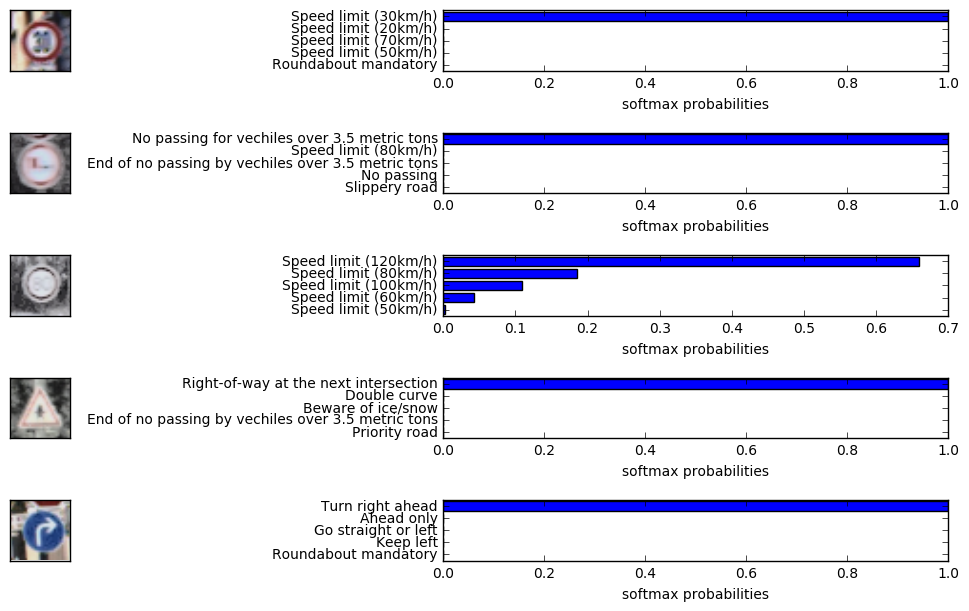

In [49]:
# plot top_k of 5 test images - for reference
topk_plot(X_test_yuv[100:105])

Model restored.
top_k values, indices
[[  9.95103478e-01   4.41112556e-03   2.87706906e-04   1.52272070e-04
    2.63328093e-05]
 [  9.49997067e-01   4.96817641e-02   1.75681242e-04   1.01488855e-04
    2.33662013e-05]
 [  1.00000000e+00   2.18386368e-11   1.18829480e-12   1.67001043e-13
    8.50246861e-14]
 [  9.87444401e-01   1.19787054e-02   4.63091244e-04   1.03627550e-04
    6.99290240e-06]
 [  9.70695734e-01   2.05268096e-02   3.86756961e-03   1.48755265e-03
    1.01108302e-03]] [[ 3  5  8  7  2]
 [ 7  5  2  8 40]
 [13 12 25 17 22]
 [13 10 17 12 25]
 [12 26 20 38  5]]


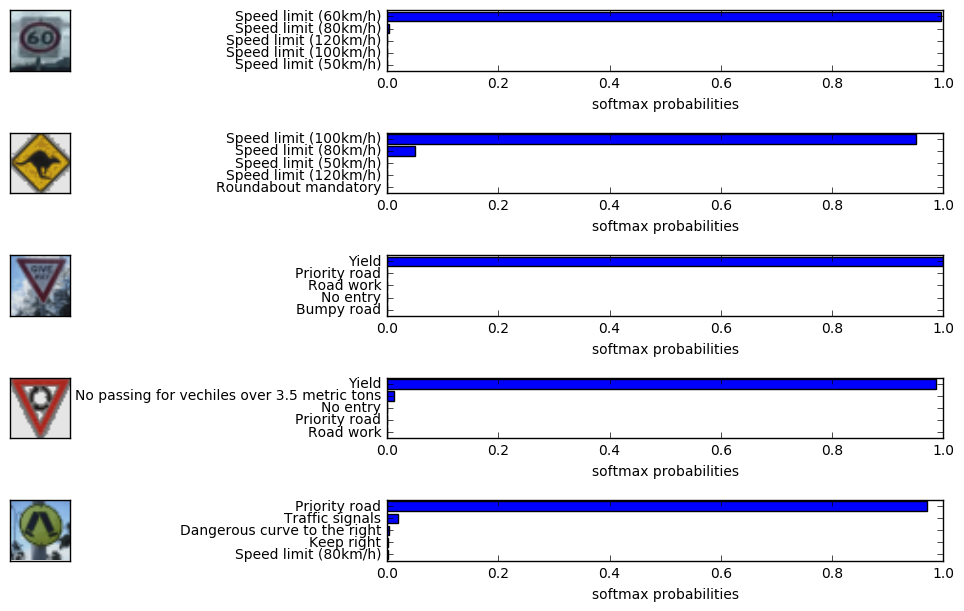

In [48]:
#plot top k of captured images
topk_plot(test_images)

**60 KM/H Sign** The classifier predicted the correct sign. 80 KM/h was the next were the first digit in the speed could be mis-classified.

**Kangaroo Sign** I'm a little amused at the predictions returned here as none of the predictions are correct.

**Giveway Sign** The classifier seems certain it is yield sign. The other predicitons aren't corrrect.

**Roundabout Sign** It seems almost certain it is a yield sign. The other predictions aren't correct.

**Pedestrain Crossing** The classifier is misplaced in all its predictions. The yellow color may have led to the priorty road prediciton.

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.